In [443]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import umap
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.mixture import GaussianMixture
from sklearn.feature_selection import SelectKBest, f_classif
import pylab
import scipy
import sklearn

In [413]:
pd.set_option("display.max_rows", 250000)

In [414]:
df = pd.read_csv('/Users/robholmstrom/OneDrive/Gitrepos/nonrepo_files/GSE59114.csv', header = 1)
df1 = df.T
df1.columns = df1.loc['Gene Symbol'].reset_index()
df1 = df1.drop(['Gene Symbol', 'UCSC transcripts'])
df1.columns = [x[1] for x in df1.columns]
df1.columns = df1.columns.str.replace("'", "")
df1.shape

(1434, 8422)

Itgam, Ly6g, Ptprc, Cd3e, Ly76, Kit, Ly6a, Cd48, Slamf1

In [415]:
import re
df1_1 = df1[~df1.index.str.contains('biol_replicate')]
df1_1 = df1_1.drop(['\'Young LT-HSC\'','\'Young ST-HSC\'', '\'Young MPP\'','\'Old LT-HSC\'', '\'Old ST-HSC\'','Old MPP\''])
df1_1 = df1_1.drop(['Itgam', 'Ptprc', 'Kit', 'Ly6a', 'Cd48', 'Slamf1'], axis = 1)

In [481]:
df1_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1058 entries, youngLTHSC to oldMPP
Columns: 8416 entries, Npl to Sft2d1
dtypes: object(8416)
memory usage: 68.0+ MB


In [417]:
df1_1.index = df1_1.index.str.replace(r'[^a-zA-Z]', '')

print((df1_1.columns).shape)
print(np.unique(df1_1.columns).shape)

(8416,)
(8351,)


In [418]:
df1_1dup = df1_1[df1_1.loc[:,df1_1.columns.duplicated()].columns]


In [479]:
dupcols = np.unique(df1_1dup.columns)
dupcols

array(['Abcg2', 'Arih1', 'Atf7ip', 'Atrip', 'Brwd1', 'Cbx1', 'Ccnd3',
       'Cdk6', 'Celf1', 'Commd1', 'Csnk1a1', 'Ctse', 'Dnajb6', 'Eci2',
       'Eif1ax', 'Fgd4', 'Fus', 'G3bp1', 'Glod4', 'Gm10598', 'Gm13215',
       'Hjurp', 'Ikbkb', 'Ing4', 'Itga4', 'Itga6', 'Kansl2', 'Lcor',
       'Lrrc29', 'Luc7l2', 'Mafg', 'Mecom', 'Mob1a', 'Mtcp1', 'Nagk',
       'Ndufa3', 'Pafah1b1', 'Patz1', 'Pcif1', 'Pik3ip1', 'Psme4', 'Pten',
       'Ramp2', 'Rpl24', 'Rspry1', 'Satb1', 'Smarcc2', 'Srcap', 'Srsf10',
       'Sugp2', 'Taf9', 'Tex261', 'Tmem167b', 'Tmem181b-ps', 'Trappc9',
       'Trim30b', 'U2af1l4', 'Utp23', 'Wwp2', 'Zbtb20', 'Zfp708',
       'Zfp869', 'Zgpat'], dtype=object)

In [420]:
df1_1dupgroup = df1_1dup.groupby(df1_1dup.columns, axis=1).sum()

In [421]:
df1_1dupmean = pd.DataFrame()
for x in dupcols:
    df1_1dupmean[x] = df1_1dupgroup[x]/df1_1dup.columns.tolist().count(x)


In [422]:
# cols = []
# n = 1
# for x in df2dup.columns:
#     if x in cols:
#         cols.append(x+'.'+str(n))
#         n += 1
#     else:
#         cols.append(x)
#         n = 1


In [543]:
dfnodup = df1_1.loc[:,~df1_1.columns.duplicated()].drop(dupcols, axis = 1)

df2 = pd.concat([dfnodup, df1_1dupmean], axis = 1)

df2= df2.round(2)
df2

,Npl,Qk,Park2,Agpat4,Slc22a3,uc008akv.1,Airn,Mrpl18,Tcp1,Rnasel,...,Tmem181b-ps,Trappc9,Trim30b,U2af1l4,Utp23,Wwp2,Zbtb20,Zfp708,Zfp869,Zgpat
youngLTHSC,0,0,2.66676,0,0,0,0,9.25531,0,0,...,4.00,4.49,3.27,0.00,2.08,0.00,4.22,1.60,4.30,0.00
youngLTHSC,0,0,0,0,0,0,0,0,10.5123,3.63343,...,4.60,1.60,0.00,0.00,1.75,1.03,3.12,0.00,7.91,0.00
youngLTHSC,0,0,6.33181,0,0,0,3.93546,0,0,7.18398,...,4.83,3.56,0.72,0.00,0.95,0.00,4.10,0.00,0.00,0.00
youngLTHSC,0,0,0,0,0,0,0,8.79727,0,0,...,4.02,2.00,0.66,5.35,1.81,3.90,0.96,0.00,0.00,0.00
youngLTHSC,0,0,0,2.15704,6.61412,0,0,8.83564,6.11541,8.17223,...,3.71,4.07,0.00,7.58,2.19,0.00,0.00,4.20,0.00,0.00
youngLTHSC,0,0,4.9644,0,0,0,0,9.47921,1.38405,0,...,4.80,4.70,0.40,0.00,3.97,4.06,3.51,0.00,0.00,7.62
youngLTHSC,0,6.09001,0,7.24888,0,0,2.48543,8.49137,0,1.58976,...,2.75,0.99,7.01,0.00,1.36,7.30,5.07,0.00,0.00,0.00
youngLTHSC,0,0,8.01564,4.36457,0,0,0,9.08239,9.4613,8.55597,...,4.03,4.78,3.60,7.81,2.47,3.44,2.77,0.00,0.00,0.00
youngLTHSC,0,0,7.25644,8.62545,0,0,2.02503,0,7.43904,8.93041,...,3.87,2.39,0.00,6.74,1.97,0.85,6.96,0.00,0.00,0.00
youngLTHSC,0,0,0,0,3.72683,0,2.06695,7.80226,9.43946,8.739,...,7.73,5.98,0.00,7.48,1.65,6.77,4.49,3.34,0.00,3.99


In [523]:
genefracs = (df2==0).sum()/(df2==0).count()
passindex = genefracs[genefracs < 0.90]


In [524]:
dfzifa = df2[passindex.index]
dfzifa= np.round(dfzifa.astype(np.float64),4)
dfzifa = np.array(dfzifa)
dfzifa

array([[0.    , 0.    , 2.6668, ..., 1.6   , 4.3   , 0.    ],
       [0.    , 0.    , 0.    , ..., 0.    , 7.91  , 0.    ],
       [0.    , 0.    , 6.3318, ..., 0.    , 0.    , 0.    ],
       ...,
       [9.0065, 6.2319, 0.    , ..., 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
       [0.    , 0.    , 1.4276, ..., 0.44  , 5.64  , 0.    ]])

In [525]:
from ZIFA import ZIFA
from ZIFA import block_ZIFA

In [549]:
Z, model_params = block_ZIFA.fitModel(dfzifa, 10)

Filtering out all genes which are zero in more than 95.0% of samples. To change this, change p0_thresh.
Number of blocks has been set to 16
Running block zero-inflated factor analysis with N = 1058, D = 8240, K = 100, n_blocks = 16
Block sizes [515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515]


KeyboardInterrupt: 

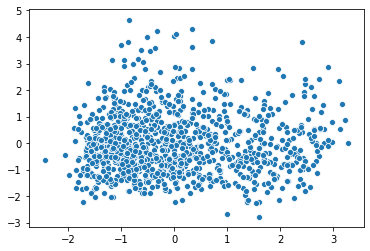

In [527]:
dfz = pd.DataFrame(Z)
pcaz = PCA(n_components=2)

zcomps = pcaz.fit_transform(dfz)
sns.scatterplot(zcomps[:,0], zcomps[:,1])
plt.show()

In [542]:
np.cov(dfz)

array([[ 0.14413889,  0.14514861,  0.10034135, ..., -0.07331674,
        -0.11504954, -0.17160618],
       [ 0.14514861,  0.35019002,  0.22614008, ..., -0.28971779,
        -0.23870202, -0.46679597],
       [ 0.10034135,  0.22614008,  0.3210556 , ..., -0.11860606,
        -0.08132714, -0.3460411 ],
       ...,
       [-0.07331674, -0.28971779, -0.11860606, ...,  0.34615494,
         0.27363256,  0.39385687],
       [-0.11504954, -0.23870202, -0.08132714, ...,  0.27363256,
         0.44449892,  0.42300886],
       [-0.17160618, -0.46679597, -0.3460411 , ...,  0.39385687,
         0.42300886,  0.71798857]])

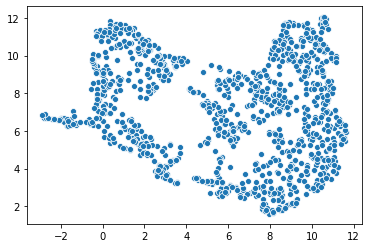

In [548]:
zumap = umap.UMAP(n_neighbors=10,
                      min_dist=.3,
                      metric='correlation').fit_transform(dfz)
sns.scatterplot(zumap[:,0], zumap[:,1])

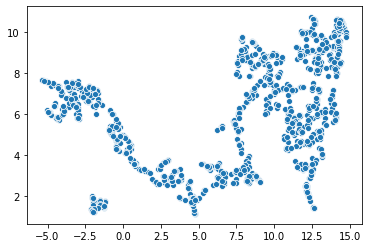

'Sell', 'Pdcd4', 'Cd34', 'Gnb1', 'Plac8', 'Flt3', 'Cbx3', 'Mmrn1',
       'BC035044', 'Nkg7', 'Nupr1', 'Sult1a1', 'Arglu1', 'Gpr97', 'uc012hdk.1',
       'Tespa1', 'Mpo', 'Eif1', 'Zfp187', 'Sod1'

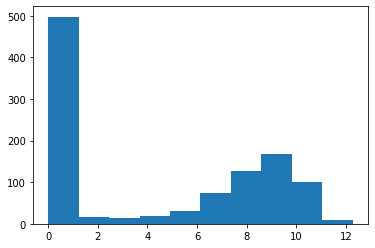

In [220]:
plt.hist(df2['Flt3'])
plt.show()

(array([ 16.,  89., 234., 248., 186., 146.,  77.,  40.,  17.,   5.]),
 array([-2.59226363, -1.89380985, -1.19535606, -0.49690227,  0.20155151,
         0.9000053 ,  1.59845909,  2.29691287,  2.99536666,  3.69382045,
         4.39227424]),
 <a list of 10 Patch objects>)

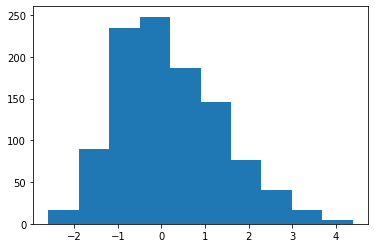

In [546]:
plt.hist(dfz[0])

In [78]:
pca = PCA(n_components = 10)
pcafitdf2 = pca.fit_transform(df2)


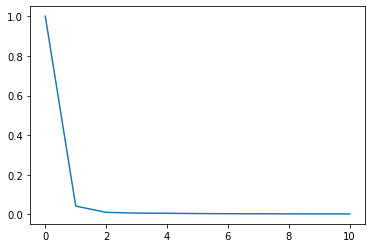

In [79]:
variance = np.insert(pca.explained_variance_ratio_, 0, 1)
x = [i for i in range(variance.shape[0])]

plt.plot(x, variance)

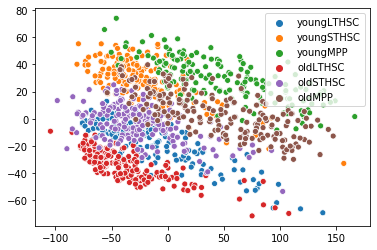

In [80]:
import seaborn as sns
sns.scatterplot(pcafitdf2[:,0], pcafitdf2[:,1], hue = df2.index)

In [81]:
umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=.1,
                      metric='euclidean').fit_transform(df2)

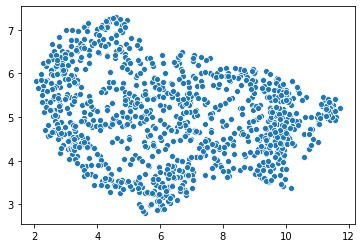

In [82]:
sns.scatterplot(umap_results[:,0], umap_results[:,1])

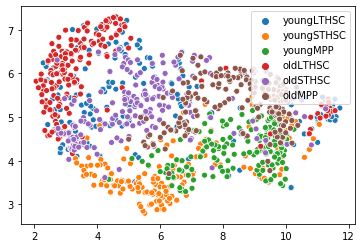

In [83]:
sns.scatterplot(umap_results[:,0], umap_results[:,1], hue = df2.index)

In [84]:
import random
cell_types = np.unique(df2.index).tolist()
c = []
for i in range(len(cell_types)):
    r = random.random()
    g = random.random()
    b = random.random()
    color = (r,g,b)
    c.append(color)

In [85]:
print(umap_results[:][0].max())
print(umap_results[:][0].min())
print(umap_results[:][1].max())
print(umap_results[:][1].min())


5.23312
5.0358334
5.4210515
2.752068


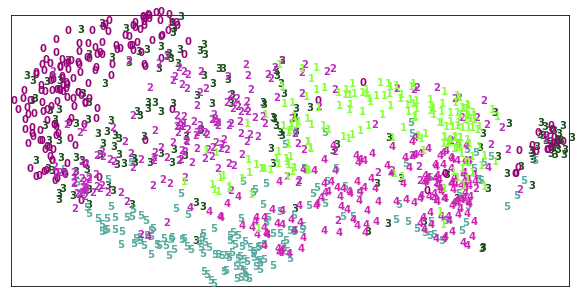

In [86]:
plt.figure(figsize = (10,5))
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i][0], umap_results[i][1], str(cell_types.index(df2.index[i])),
    color = c[int(cell_types.index(df2.index[i]))],
    fontdict={'weight': 'bold', 'size': 10})
    


plt.xlim(min(umap_results, key = lambda x:x[0])[0], max(umap_results, key = lambda x:x[0])[0])
plt.ylim(min(umap_results, key = lambda x:x[1])[1], max(umap_results, key = lambda x:x[1])[1])
plt.xticks([])
plt.yticks([])

plt.show()

In [87]:
dbscan_clusters6 = DBSCAN(eps=2, min_samples=1, metric = 'euclidean', algorithm = 'ball_tree')

# Fit model
clusters6 = dbscan_clusters6.fit_predict(df2)
clusters6_trans = clusters6
np.unique(clusters6)

array([   0,    1,    2, ..., 1055, 1056, 1057])

In [88]:
pca = PCA(n_components = 10)
pcafitdf2 = pca.fit_transform(df2)


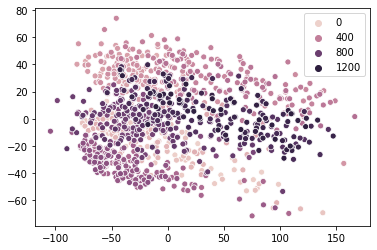

In [89]:
sns.scatterplot(pcafitdf2[:,0], pcafitdf2[:,1], hue = clusters6_trans)

In [90]:
gmm = GaussianMixture(n_components = 6)
gmm.fit(df2)
cluster = gmm.fit_predict(df2)

In [91]:
np.unique(cluster)

array([0, 1, 2, 3, 4, 5])

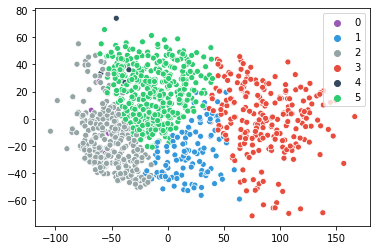

In [92]:
sns.scatterplot(pcafitdf2[:,0], pcafitdf2[:,1], hue = cluster, palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"})


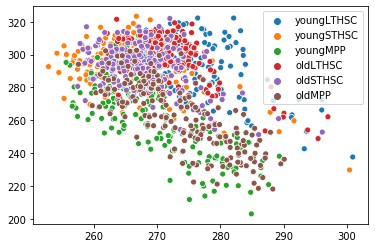

In [93]:
km = KMeans(n_clusters = 6, random_state=42)
kmdata = km.fit_transform(df2)
sns.scatterplot(kmdata[:,0], kmdata[:, 1], hue = df2.index)

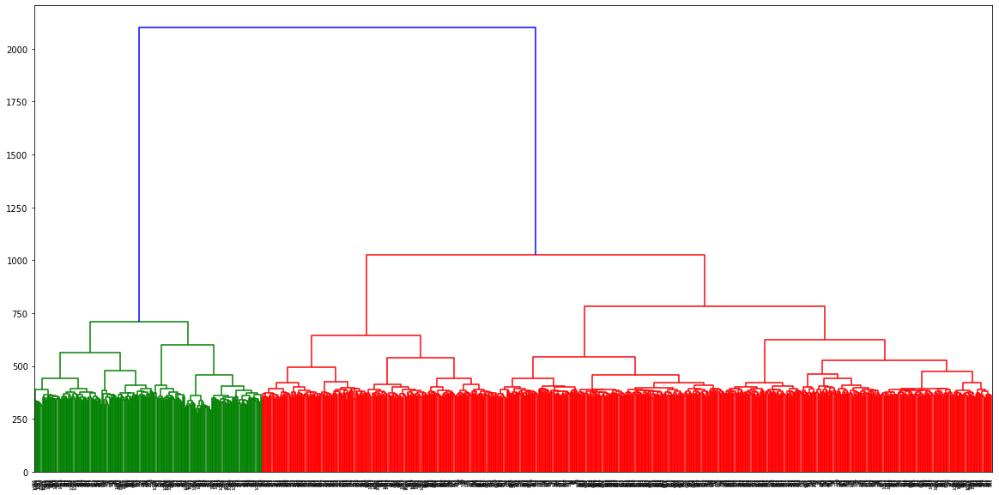

In [94]:
agg = AgglomerativeClustering(n_clusters = 50, affinity='cosine',linkage = 'complete')
aggdata = agg.fit(df2)
plt.figure(figsize=(20,10))
dendrogram(linkage(df2, method = 'ward'))
plt.show()

In [95]:
umap_results

array([[5.0358334, 5.23312  ],
       [2.752068 , 5.4210515],
       [5.3464975, 6.2330346],
       ...,
       [8.608947 , 5.2132506],
       [7.908918 , 5.269794 ],
       [8.157675 , 5.938928 ]], dtype=float32)

In [96]:
dfcelltypes = pd.DataFrame(df2.mean(), columns = ['All cell average'])
dfcelltypes['youngLTHSC'] = df2[df2.index == 'youngLTHSC'].mean()
dfcelltypes['youngSTHSC'] = df2[df2.index == 'youngSTHSC'].mean()
dfcelltypes['youngMPP'] = df2[df2.index == 'youngMPP'].mean()
dfcelltypes['oldLTHSC'] = df2[df2.index == 'oldLTHSC'].mean()
dfcelltypes['oldSTHSC'] = df2[df2.index == 'oldSTHSC'].mean()
dfcelltypes['oldMPP'] = df2[df2.index == 'oldMPP'].mean()


In [97]:
dfcellbroad = pd.DataFrame(df2.mean(), columns = ['All cell average'])
dfcellbroad['HSC'] = df2[df2.index.str.contains('HSC')].mean()
dfcellbroad['MPP'] = df2[df2.index.str.contains('MPP')].mean()
dfcellbroad['HSC/MPP'] = dfcellbroad['HSC']/dfcellbroad['MPP']
dfcellbroad.sort_values(by = ['HSC/MPP','HSC','MPP'], ascending = False).head(25000)


,All cell average,HSC,MPP,HSC/MPP
Efna1,0.643544,0.969900,0.000000,inf
Epor,0.195877,0.295211,0.000000,inf
A230065H16Rik,0.188853,0.284625,0.000000,inf
Entpd2,0.118546,0.178663,0.000000,inf
uc012bnh.1,0.012621,0.019021,0.000000,inf
Chst2,0.390360,0.586061,0.004454,131.566650
Tenc1,0.414738,0.620018,0.009946,62.336291
Sytl5,0.261054,0.390131,0.006526,59.776644
Smtnl1,0.344110,0.513502,0.010084,50.924486
Fkbp10,0.207363,0.307573,0.009758,31.520597


(array([2425., 2567., 1515.,  823.,  515.,  282.,  154.,   83.,   48.,
           4.]),
 array([ 0.        ,  1.35720668,  2.71441337,  4.07162005,  5.42882674,
         6.78603342,  8.1432401 ,  9.50044679, 10.85765347, 12.21486016,
        13.57206684]),
 <a list of 10 Patch objects>)

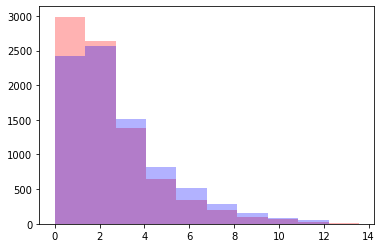

In [98]:
plt.hist(dfcellbroad.HSC, color = 'r', alpha = 0.3)
plt.hist(dfcellbroad.MPP, color = 'b', alpha = 0.3)

In [99]:
dfcbnonzeros = dfcellbroad[dfcellbroad != 0].dropna()
dfcbnonzeros.sort_values(by = ['HSC/MPP','HSC','MPP'], ascending = False).head(25000)

,All cell average,HSC,MPP,HSC/MPP
Chst2,0.390360,0.586061,0.004454,131.566650
Tenc1,0.414738,0.620018,0.009946,62.336291
Sytl5,0.261054,0.390131,0.006526,59.776644
Smtnl1,0.344110,0.513502,0.010084,50.924486
Fkbp10,0.207363,0.307573,0.009758,31.520597
Trim47,0.618175,0.916443,0.030017,30.530950
Sdpr,1.132630,1.675964,0.061224,27.374495
Prom2,0.127064,0.187108,0.008662,21.600069
Gstm2,0.393672,0.579075,0.028073,20.627192
Cldn5,0.133280,0.196043,0.009517,20.598401


In [162]:
y = [x for x in df2.index]

k = 20
kbest = SelectKBest(k=k, score_func=f_classif)
X_best_feat = kbest.fit_transform(df2,y)

X_best_feat = pd.DataFrame(X_best_feat, columns=df2.columns[kbest.get_support()])

trimcol = X_best_feat.columns
trimcol


Index(['Sell', 'Pdcd4', 'Cd34', 'Gnb1', 'Plac8', 'Flt3', 'Cbx3', 'Mmrn1',
       'BC035044', 'Nkg7', 'Nupr1', 'Sult1a1', 'Arglu1', 'Gpr97', 'uc012hdk.1',
       'Tespa1', 'Mpo', 'Eif1', 'Zfp187', 'Sod1'],
      dtype='object')

In [163]:
df2trim = df2.drop(trimcol, axis = 1).copy()
df2sel = df2[trimcol]
print(df2trim.shape, df2.shape)

(1058, 8396) (1058, 8416)


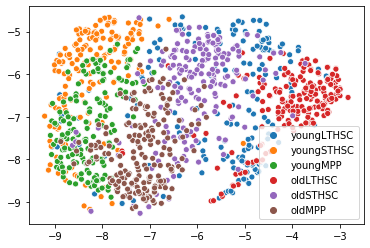

In [164]:
umap_resultstrim = umap.UMAP(n_neighbors=10,
                      min_dist=.1,
                      metric='correlation').fit_transform(df2trim)
sns.scatterplot(umap_resultstrim[:,0], umap_resultstrim[:,1], hue = df2.index)

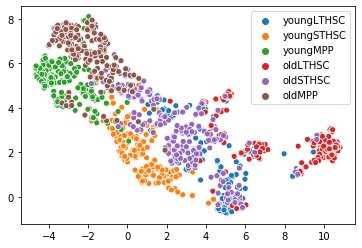

In [183]:
umap_resultssel = umap.UMAP(n_neighbors=50,
                      min_dist=.3,
                      metric='euclidean').fit_transform(df2sel)
sns.scatterplot(umap_resultssel[:,0], umap_resultssel[:,1], hue = df2.index)

In [184]:
pcatrim = PCA(n_components = 10)
pcafitdf2t = pcatrim.fit_transform(df2trim)

In [185]:
pcasel = PCA(n_components = 10)
pcafitdf2s = pcasel.fit_transform(df2sel)

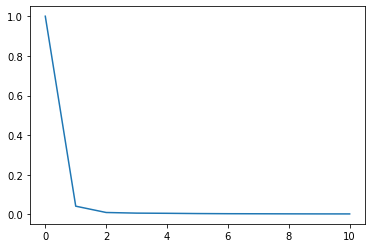

In [186]:
variancet = np.insert(pcatrim.explained_variance_ratio_, 0, 1)
x = [i for i in range(variancet.shape[0])]

plt.plot(x, variancet)

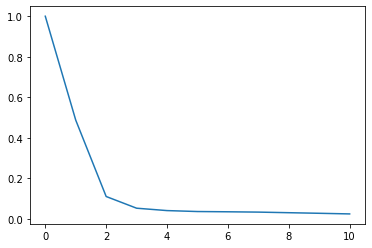

In [187]:
variances = np.insert(pcasel.explained_variance_ratio_, 0, 1)
x = [i for i in range(variances.shape[0])]

plt.plot(x, variances)

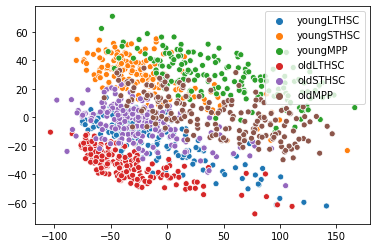

In [188]:
import seaborn as sns
sns.scatterplot(pcafitdf2t[:,0], pcafitdf2t[:,1], hue = df2.index)


variance threshold

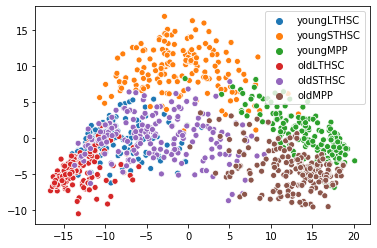

In [189]:
sns.scatterplot(pcafitdf2s[:,0], pcafitdf2s[:,1], hue = df2.index)

In [190]:
gmm = GaussianMixture(n_components = 6)
gmm.fit(df2sel)
cluster = gmm.fit_predict(df2sel)

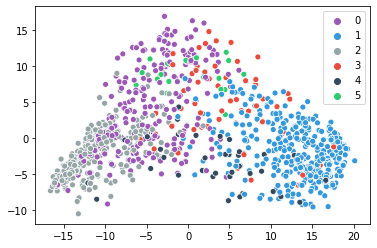

In [191]:
sns.scatterplot(pcafitdf2s[:,0], pcafitdf2s[:,1], hue = cluster,alpha = 1,palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"} )

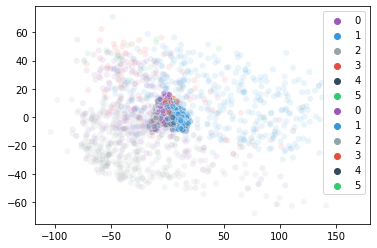

In [192]:
sns.scatterplot(pcafitdf2s[:,0], pcafitdf2s[:,1], alpha = .5,hue = cluster, palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"})
sns.scatterplot(pcafitdf2t[:,0], pcafitdf2t[:,1], hue = cluster, alpha = .1,
palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"})

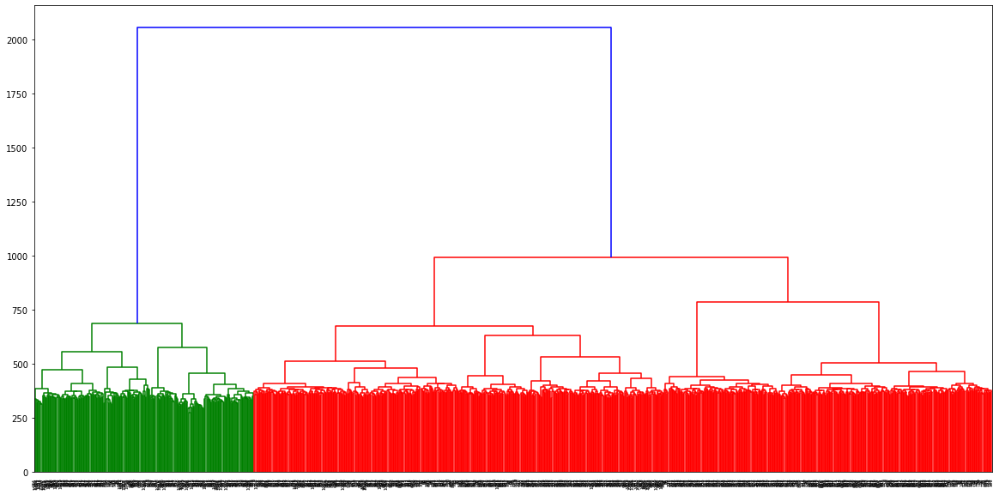

In [193]:
aggtrim = AgglomerativeClustering(n_clusters = 50, affinity='euclidean',linkage = 'complete')
aggtrimdata = aggtrim.fit(df2trim)
plt.figure(figsize=(20,10))
dendrogram(linkage(df2trim, method = 'ward'))
plt.show()

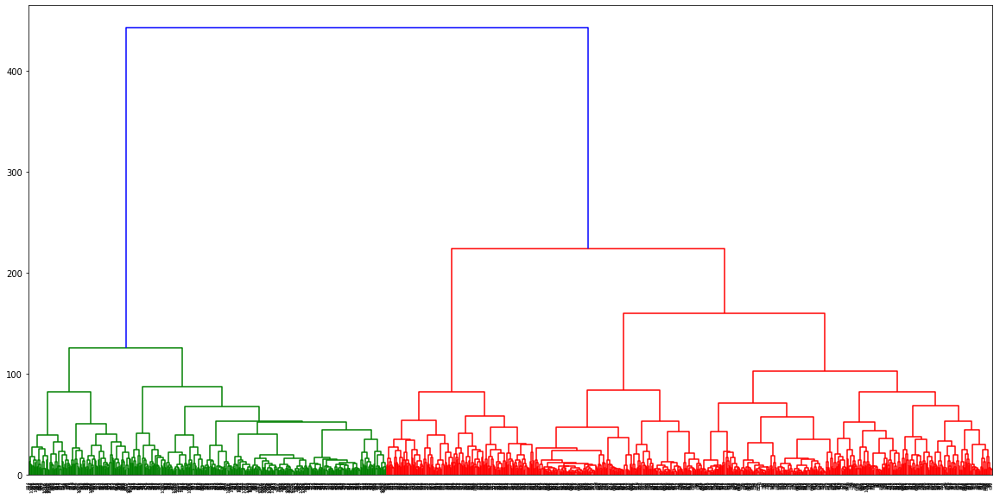

In [194]:
aggsel = AgglomerativeClustering(n_clusters = 50, affinity='euclidean',linkage = 'complete')
aggseldata = aggsel.fit(df2sel)
plt.figure(figsize=(20,10))
dendrogram(linkage(df2sel, method = 'ward'))
plt.show()

In [195]:
dfcellbroad['HSC'].corr(dfcellbroad['MPP'])

0.9384699596058312

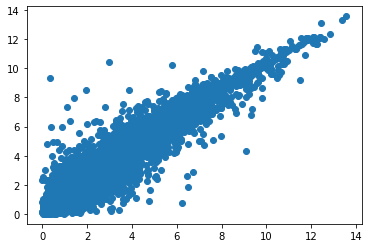

In [196]:
plt.scatter(dfcellbroad['HSC'], dfcellbroad['MPP'])